<a href="https://colab.research.google.com/github/Shah12345678901/Sign-Language-Generation-From-Video-Using-YOLOV5/blob/main/Sign_Language_Generation_From_Image_Using_YOLOV5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Install Dependencies

In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git  # clone repo
%cd yolov5
# !git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 12262, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 12262 (delta 2), reused 6 (delta 1), pack-reused 12250
Receiving objects: 100% (12262/12262), 11.96 MiB | 14.07 MiB/s, done.
Resolving deltas: 100% (8488/8488), done.
/content/yolov5


In [2]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
#from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 5.3 MB/s 
Setup complete. Using torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


# Your Custom Data

In [10]:
%cd /content 
!unzip test.zip


/content
Archive:  test.zip
   creating: test/
   creating: test/images/
  inflating: test/images/Hello.5596b398-ef8c-11ec-ab06-c03eba386ebe.jpg  
  inflating: test/images/Hello.58015b55-ef8c-11ec-b569-c03eba386ebe.jpg  
  inflating: test/images/Hello.6115830b-ef8c-11ec-9d7e-c03eba386ebe.jpg  
  inflating: test/images/Hello.62497df0-ef8c-11ec-8f34-c03eba386ebe.jpg  
  inflating: test/images/IloveYou.745e6118-ef8c-11ec-b959-c03eba386ebe.jpg  
  inflating: test/images/IloveYou.75933f98-ef8c-11ec-af1b-c03eba386ebe.jpg  
  inflating: test/images/IloveYou.792ebf04-ef8c-11ec-a925-c03eba386ebe.jpg  
  inflating: test/images/IloveYou.82d31d6f-ef8c-11ec-ac3a-c03eba386ebe.jpg  
  inflating: test/images/Please.919c25cb-ef8c-11ec-ac3e-c03eba386ebe.jpg  
  inflating: test/images/Please.92e2d2fb-ef8c-11ec-997c-c03eba386ebe.jpg  
  inflating: test/images/Please.97b112d6-ef8c-11ec-9b1a-c03eba386ebe.jpg  
  inflating: test/images/Please.98e5c2eb-ef8c-11ec-93db-c03eba386ebe.jpg  
   creating: test/label

In [11]:
!unzip train.zip

Archive:  train.zip
   creating: train/
   creating: train/images/
  inflating: train/images/Hello.52f5f92f-ef8c-11ec-8186-c03eba386ebe.jpg  
  inflating: train/images/Hello.59dcf6d5-ef8c-11ec-894a-c03eba386ebe.jpg  
  inflating: train/images/Hello.5b108393-ef8c-11ec-84fc-c03eba386ebe.jpg  
  inflating: train/images/Hello.5c467bea-ef8c-11ec-948e-c03eba386ebe.jpg  
  inflating: train/images/Hello.5d7902da-ef8c-11ec-9dd7-c03eba386ebe.jpg  
  inflating: train/images/Hello.5eacee16-ef8c-11ec-8f31-c03eba386ebe.jpg  
  inflating: train/images/Hello.5fe0e28e-ef8c-11ec-ab22-c03eba386ebe.jpg  
  inflating: train/images/Hello.637df324-ef8c-11ec-b857-c03eba386ebe.jpg  
  inflating: train/images/Hello.64b1b882-ef8c-11ec-a59d-c03eba386ebe.jpg  
  inflating: train/images/Hello.65e4aa1f-ef8c-11ec-b80d-c03eba386ebe.jpg  
  inflating: train/images/IloveYou.6d1f1597-ef8c-11ec-9dc2-c03eba386ebe.jpg  
  inflating: train/images/IloveYou.6e539aee-ef8c-11ec-8b58-c03eba386ebe.jpg  
  inflating: train/images/I

In [12]:
%cat data.yaml

train: ../train/images
val: ../test/images

nc: 3
names: ['Hello', 'I love  You',  'Please']


**Define Model Configuration and Architecture**

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [14]:
# define number of classes based on YAML
import yaml
with open("data.yaml",'r') as stream:
  num_classes=str(yaml.safe_load(stream)['nc'])

In [15]:
num_classes

'3'

In [16]:
#this is the model configuration we will use 
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [17]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [18]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

**Train Custom YOLOv5 Detector**

Next, we'll fire off training!
Here, we are able to pass a number of arguments:

img: define input image size

batch: determine batch size

epochs: define the number of training 
epochs. (Note: often, 3000+ are common here!)

data: set the path to our yaml file

cfg: specify our model configuration

weights: specify a custom path to 
weights. (Note: you can download weights from the Ultralytics Google Drive folder)

name: result names

nosave: only save the final checkpoint

cache: cache images for faster training

In [19]:
# train yolov5s on custom data for 300 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 10 --epochs 300 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_result  --cache

/content/yolov5
train: weights=yolov5s.pt, cfg=./models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=10, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_result, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-258-g1156a32 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, f

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [20]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

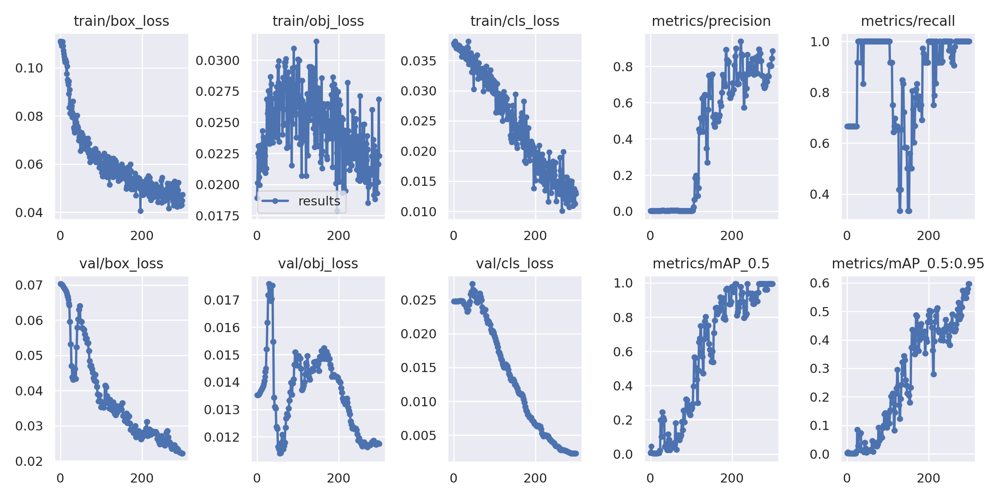

In [23]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_result/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


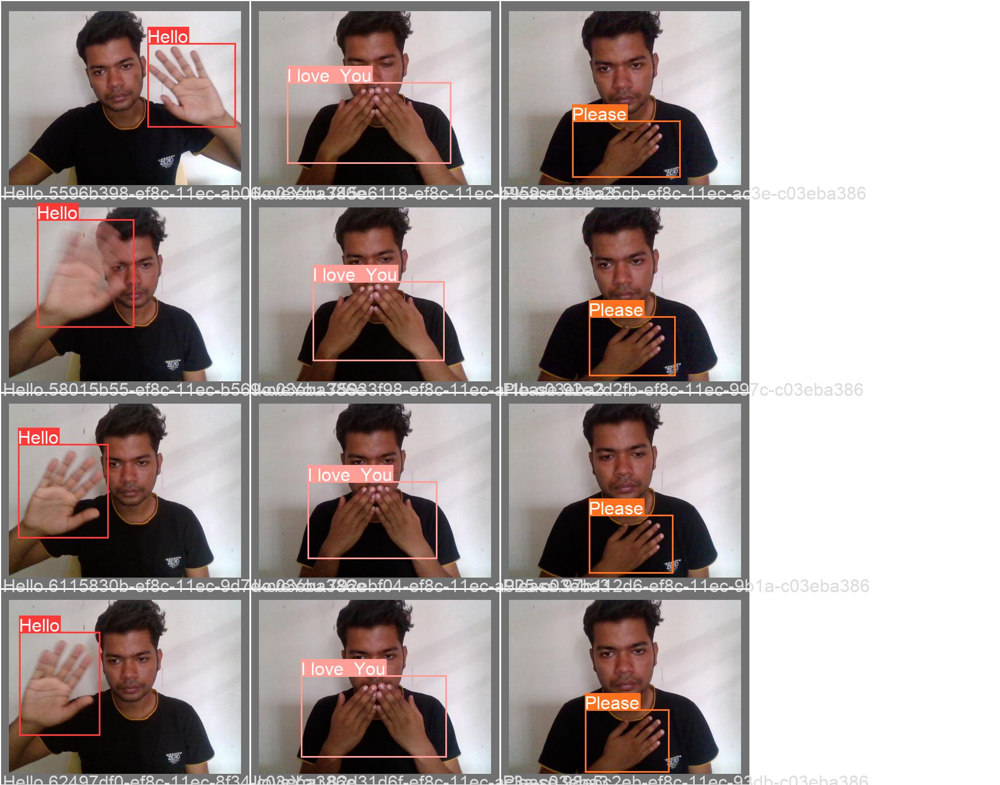

In [24]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_result/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


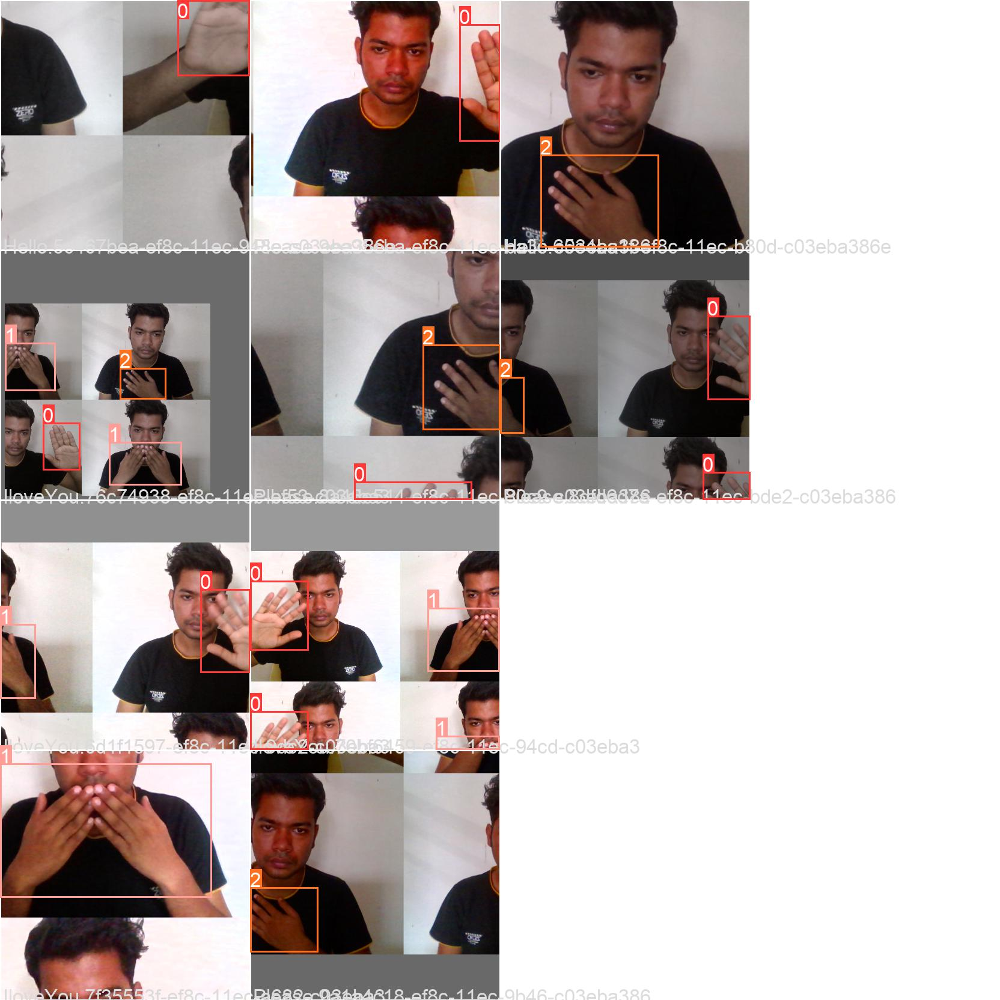

In [26]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_result/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [27]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [28]:
%ls runs/train/yolov5s_result/weights

best.pt  last.pt


In [30]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_result/weights/best.pt --img 416 --conf 0.5 --source ../test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_result/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-258-g1156a32 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7251912 parameters, 0 gradients
image 1/12 /content/test/images/Hello.5596b398-ef8c-11ec-ab06-c03eba386ebe.jpg: 320x416 1 Hello, Done. (0.020s)
image 2/12 /content/test/images/Hello.58015b55-ef8c-11ec-b569-c03eba386ebe.jpg: 320x416 1 Hello, Done. (0.016s)
image 3/12 /content/test/images/Hello.6115830b-ef8c-11ec-9d7e-c03eba386ebe.jpg: 320x416 1 Hello, Done. (0.015s)
image 4

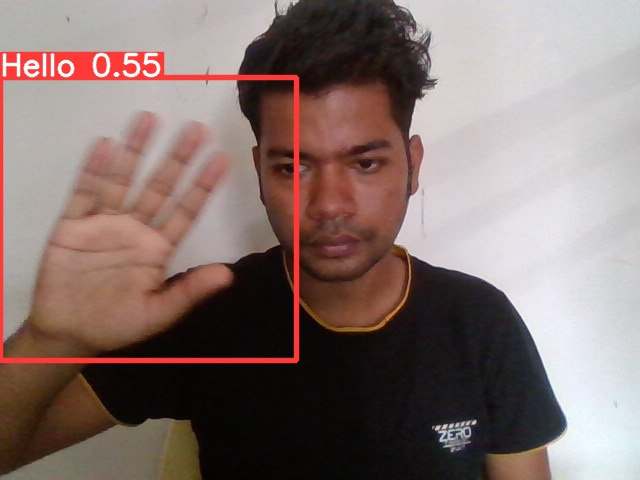

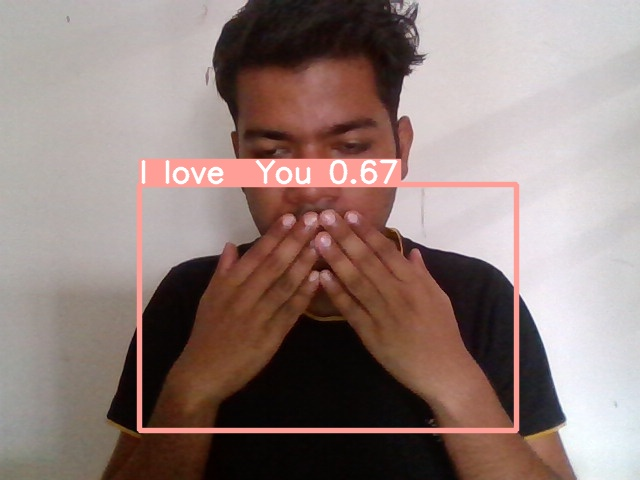

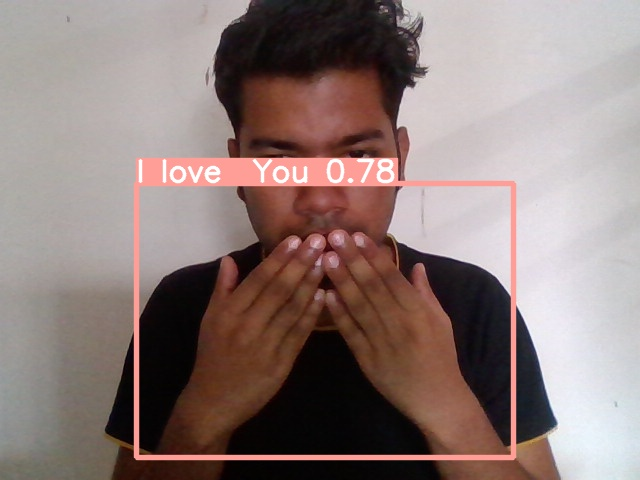

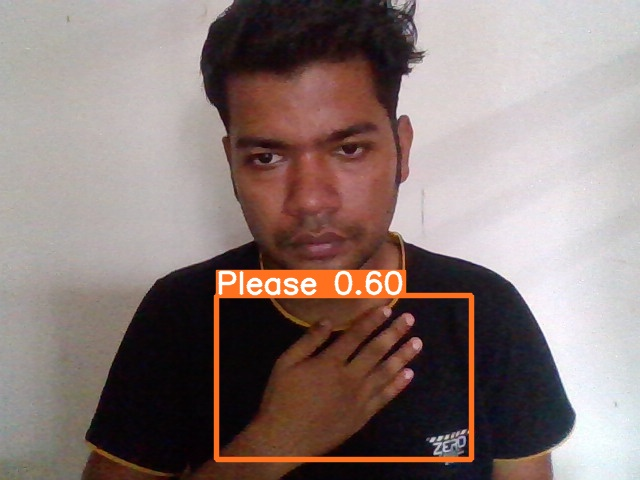

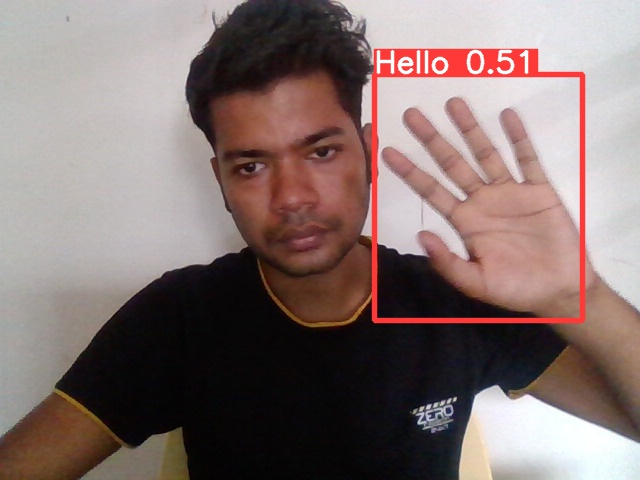

...

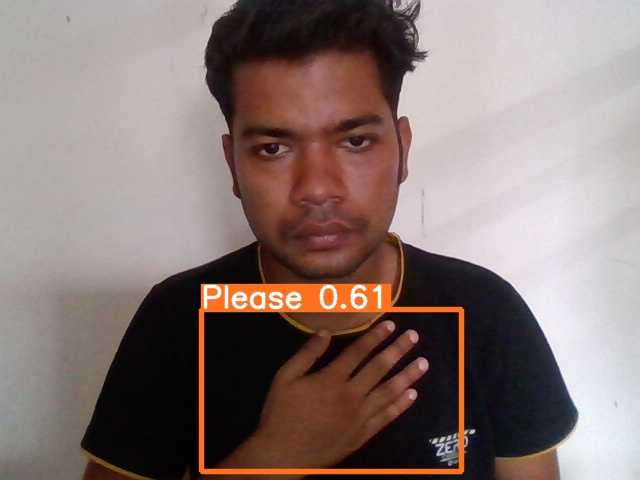

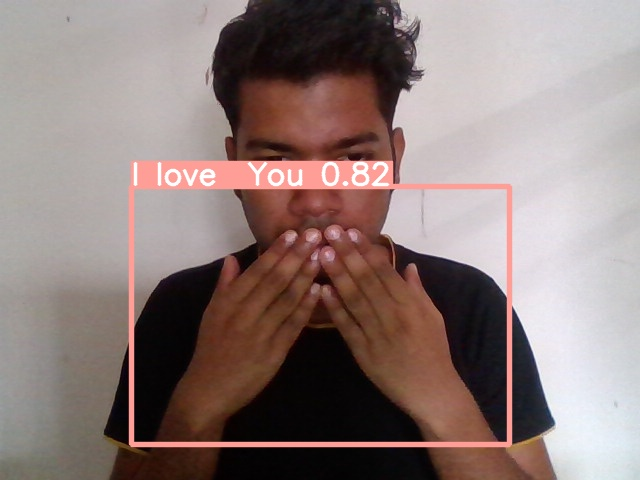

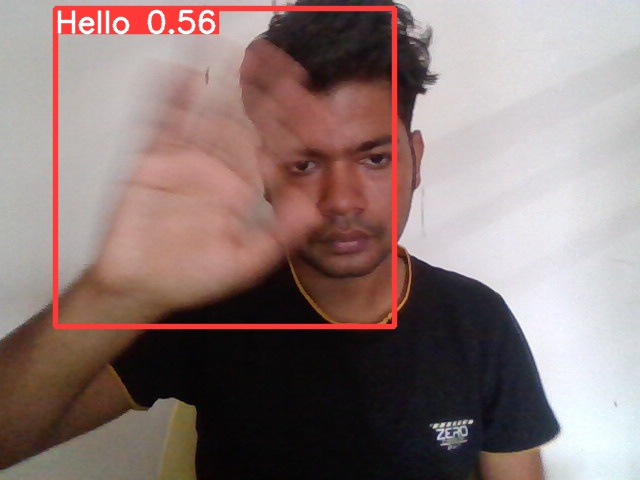

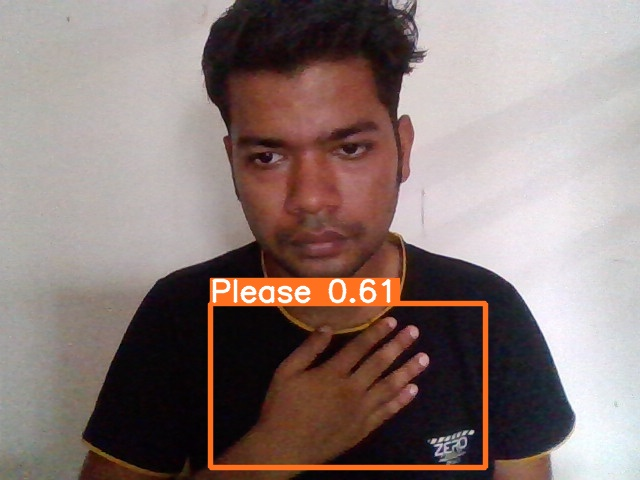

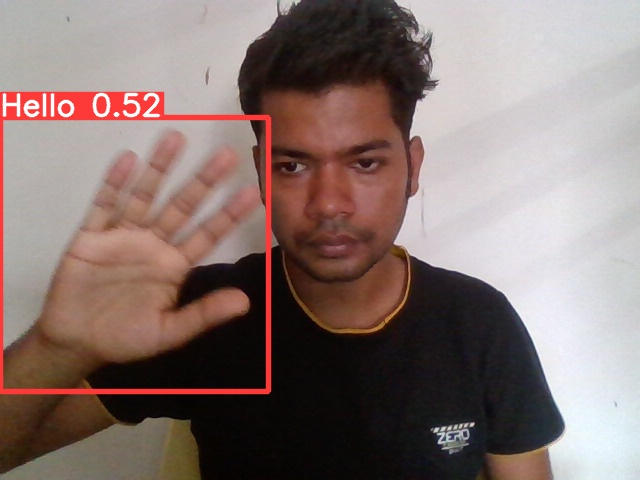

In [45]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere